In [ ]:
!pip3 install kaggle

In [ ]:
!mkdir .kaggle

In [ ]:
!mkdir ~/.kaggle/

In [ ]:
import json
token = {"username":"rajasekhar92","key":"435cf52ef688c04be1617f103cb47268"}
with open('/content/.kaggle/kaggle.json','w') as file:
  json.dump(token,file)

In [ ]:
!cp /content/.kaggle/kaggle.json ~/.kaggle/kaggle.json

In [ ]:
!kaggle config set -n path -v{/content}

- path is now set to: {/content}


In [ ]:
!chmod 600 /root/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d srbhshinde/flickr8k-sau

100% 2.08G/2.08G [01:41<00:00, 20.7MB/s]
100% 2.08G/2.08G [01:41<00:00, 22.0MB/s]


In [ ]:
!kaggle datasets download -d yliu9999/glove6b50d

 99% 67.0M/67.7M [00:04<00:00, 22.7MB/s]
100% 67.7M/67.7M [00:04<00:00, 16.0MB/s]


In [ ]:
cd /content/{/content}/datasets

/content/{/content}/datasets


In [ ]:
ls

srbhshinde/  yliu9999/


In [ ]:
!unzip yliu9999/glove6b50d/glove6b50d.zip

Archive:  yliu9999/glove6b50d/glove6b50d.zip
  inflating: glove.6B.50d.txt        


In [ ]:
!unzip srbhshinde/flickr8k-sau/flickr8k-sau.zip

Streaming output truncated to the last 5000 lines.
  inflating: flickr8k-sau/Flickr_Data/Images/2844747252_64567cf14a.jpg  
  inflating: flickr8k-sau/Flickr_Data/Images/2844846111_8c1cbfc75d.jpg  
  inflating: flickr8k-sau/Flickr_Data/Images/2844963839_ff09cdb81f.jpg  
  inflating: flickr8k-sau/Flickr_Data/Images/2845246160_d0d1bbd6f0.jpg  
  inflating: flickr8k-sau/Flickr_Data/Images/2845691057_d4ab89d889.jpg  
  inflating: flickr8k-sau/Flickr_Data/Images/2845845721_d0bc113ff7.jpg  
  inflating: flickr8k-sau/Flickr_Data/Images/2846037553_1a1de50709.jpg  
  inflating: flickr8k-sau/Flickr_Data/Images/2846785268_904c5fcf9f.jpg  
  inflating: flickr8k-sau/Flickr_Data/Images/2846843520_b0e6211478.jpg  
  inflating: flickr8k-sau/Flickr_Data/Images/2847514745_9a35493023.jpg  
  inflating: flickr8k-sau/Flickr_Data/Images/2847615962_c330bded6e.jpg  
  inflating: flickr8k-sau/Flickr_Data/Images/2847859796_4d9cb0d31f.jpg  
  inflating: flickr8k-sau/Flickr_Data/Images/2848266893_9693c66275.jpg  


In [ ]:
ls

flickr8k-sau/  Flickr_Data/  glove.6B.50d.txt  srbhshinde/  yliu9999/


In [ ]:
cd Flickr_Data/

/content/{/content}/datasets/Flickr_Data


In [ ]:
ls

Flickr_TextData/  Images/


In [ ]:
cd ..

/content/{/content}/datasets


In [ ]:
flickr_path = 'Flickr_Data/'

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import keras
import re
import nltk
from nltk.corpus import stopwords
import string
import json
from time import time
import pickle
from keras.applications.vgg16 import VGG16
from keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from keras.preprocessing import image
from keras.models import Model, load_model
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.layers import Input, Dense, Dropout, Embedding, LSTM
from tensorflow.keras.layers import add

In [ ]:
with open(flickr_path+"Flickr_TextData/Flickr8k.token.txt") as filepath:
  captions = filepath.read()
  filepath.close()

In [ ]:
captions = captions.split("\n")[:-1]

In [ ]:
len(captions)

40460

In [ ]:
captions[:5]

['1000268201_693b08cb0e.jpg#0\tA child in a pink dress is climbing up a set of stairs in an entry way .',
 '1000268201_693b08cb0e.jpg#1\tA girl going into a wooden building .',
 '1000268201_693b08cb0e.jpg#2\tA little girl climbing into a wooden playhouse .',
 '1000268201_693b08cb0e.jpg#3\tA little girl climbing the stairs to her playhouse .',
 '1000268201_693b08cb0e.jpg#4\tA little girl in a pink dress going into a wooden cabin .']

In [ ]:
#creating a "descriptions" dictionary where key is 'img_name' and value is list of captions corresponding to that image
descriptions={}
for ele in captions:
  i_to_c = ele.split("\t")
  img_name = i_to_c[0].split(".")[0]
  cap = i_to_c[1]

  if descriptions.get(img_name) == None:
    descriptions[img_name]=[]

  descriptions[img_name].append(cap)

In [ ]:
descriptions['1000268201_693b08cb0e']

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

cleaning

In [ ]:
"""1.lower each word
2.remove punctuations
3.remove words less than length 1"""
def clean_text(sample):
  sample = sample.lower()

  sample = re.sub("[^a-z]+"," ",sample)

  sample = sample.split()

  sample = [s for s in sample if len(s)>1]

  sample = " ".join(sample)

  return sample

In [ ]:
clean_text("My neighbour is an crickter101 213")

'my neighbour is an crickter'

In [ ]:
#modify all the captions i.e - cleaned captions
for key, desc_list in descriptions.items():
  for i in range(len(desc_list)):
    desc_list[i]=clean_text(desc_list[i])

In [ ]:
descriptions['1000268201_693b08cb0e']

['child in pink dress is climbing up set of stairs in an entry way',
 'girl going into wooden building',
 'little girl climbing into wooden playhouse',
 'little girl climbing the stairs to her playhouse',
 'little girl in pink dress going into wooden cabin']

In [ ]:
#writing clean descriptions to .txt file
f=open("descriptions.txt","w")
f.write(str(descriptions))
f.close()

In [ ]:
#reading description file
f = open("descriptions.txt",'r')
descriptions=f.read()
f.close()

json_acceptable_string = descriptions.replace("'","\"")
descriptions = json.loads(json_acceptable_string)

In [ ]:
descriptions

{'1000268201_693b08cb0e': ['child in pink dress is climbing up set of stairs in an entry way',
  'girl going into wooden building',
  'little girl climbing into wooden playhouse',
  'little girl climbing the stairs to her playhouse',
  'little girl in pink dress going into wooden cabin'],
 '1001773457_577c3a7d70': ['black dog and spotted dog are fighting',
  'black dog and tri colored dog playing with each other on the road',
  'black dog and white dog with brown spots are staring at each other in the street',
  'two dogs of different breeds looking at each other on the road',
  'two dogs on pavement moving toward each other'],
 '1002674143_1b742ab4b8': ['little girl covered in paint sits in front of painted rainbow with her hands in bowl',
  'little girl is sitting in front of large painted rainbow',
  'small girl in the grass plays with fingerpaints in front of white canvas with rainbow on it',
  'there is girl with pigtails sitting in front of rainbow painting',
  'young girl with p

In [ ]:
#finding the unique vocabulary
vocabulary = set()
for key in descriptions.keys():
  [vocabulary.update(i.split()) for i in descriptions[key]]
print('Vocabulary Size : %d' % len(vocabulary))

Vocabulary Size : 8424


In [ ]:
#All words in description dictionary
all_vocab=[]

for key in descriptions.keys():
  [all_vocab.append(i) for des in descriptions[key] for i in des.split()]
print('Vocabulary Size: %d' % len(all_vocab))
print(all_vocab[:15])

Vocabulary Size: 373837
['child', 'in', 'pink', 'dress', 'is', 'climbing', 'up', 'set', 'of', 'stairs', 'in', 'an', 'entry', 'way', 'girl']


In [ ]:
#count the frequency of each word, sort them and discard the words havning frequency lesser than threshold value
import collections
counter = collections.Counter(all_vocab)
dic_ = dict(counter)
threshelod_value =10

sorted_dic = sorted(dic_.items(),reverse=True, key = lambda x: x[1])
sorted_dic=[x for x in sorted_dic if x[1]>threshelod_value]
all_vocab = [x[0] for x in sorted_dic]

In [ ]:
len(all_vocab)

1845

In [ ]:
#TrainImagesFile
f=open(flickr_path+"Flickr_TextData/Flickr_8k.trainImages.txt")
train=f.read()
f.close()

In [ ]:
train

'2513260012_03d33305cf.jpg\n2903617548_d3e38d7f88.jpg\n3338291921_fe7ae0c8f8.jpg\n488416045_1c6d903fe0.jpg\n2644326817_8f45080b87.jpg\n218342358_1755a9cce1.jpg\n2501968935_02f2cd8079.jpg\n2699342860_5288e203ea.jpg\n2638369467_8fc251595b.jpg\n2926786902_815a99a154.jpg\n2851304910_b5721199bc.jpg\n3423802527_94bd2b23b0.jpg\n3356369156_074750c6cc.jpg\n2294598473_40637b5c04.jpg\n1191338263_a4fa073154.jpg\n2380765956_6313d8cae3.jpg\n3197891333_b1b0fd1702.jpg\n3119887967_271a097464.jpg\n2276499757_b44dc6f8ce.jpg\n2506892928_7e79bec613.jpg\n2187222896_c206d63396.jpg\n2826769554_85c90864c9.jpg\n3097196395_ec06075389.jpg\n3603116579_4a28a932e2.jpg\n3339263085_6db9fd0981.jpg\n2532262109_87429a2cae.jpg\n2076906555_c20dc082db.jpg\n2502007071_82a8c639cf.jpg\n3113769557_9edbb8275c.jpg\n3325974730_3ee192e4ff.jpg\n1655781989_b15ab4cbff.jpg\n1662261486_db967930de.jpg\n2410562803_56ec09f41c.jpg\n2469498117_b4543e1460.jpg\n69710415_5c2bfb1058.jpg\n3414734842_beb543f400.jpg\n3006217970_90b42e6b27.jpg\n2192

In [ ]:
train = [e.split(".")[0] for e in train.split("\n")[:-1]]

In [ ]:
#TestImagesFile
f=open(flickr_path+"Flickr_TextData/Flickr_8k.testImages.txt")
test =f.read()
f.close()

In [ ]:
test

'3385593926_d3e9c21170.jpg\n2677656448_6b7e7702af.jpg\n311146855_0b65fdb169.jpg\n1258913059_07c613f7ff.jpg\n241347760_d44c8d3a01.jpg\n2654514044_a70a6e2c21.jpg\n2339106348_2df90aa6a9.jpg\n256085101_2c2617c5d0.jpg\n280706862_14c30d734a.jpg\n3072172967_630e9c69d0.jpg\n3482062809_3b694322c4.jpg\n1167669558_87a8a467d6.jpg\n2847615962_c330bded6e.jpg\n3344233740_c010378da7.jpg\n2435685480_a79d42e564.jpg\n3110649716_c17e14670e.jpg\n2511019188_ca71775f2d.jpg\n2521770311_3086ca90de.jpg\n2723477522_d89f5ac62b.jpg\n2218609886_892dcd6915.jpg\n3745451546_fc8ec70cbd.jpg\n2844018783_524b08e5aa.jpg\n3100251515_c68027cc22.jpg\n2207244634_1db1a1890b.jpg\n2943023421_e297f05e11.jpg\n3286822339_5535af6b93.jpg\n2479652566_8f9fac8af5.jpg\n1394368714_3bc7c19969.jpg\n872622575_ba1d3632cc.jpg\n2309860995_c2e2a0feeb.jpg\n241347204_007d83e252.jpg\n3502343542_f9b46688e5.jpg\n757332692_6866ae545c.jpg\n2748729903_3c7c920c4d.jpg\n494792770_2c5f767ac0.jpg\n3213992947_3f3f967a9f.jpg\n2295750198_6d152d7ceb.jpg\n23588980

In [ ]:
test = [e.split(".")[0] for e in test.split("\n")[:-1]]

In [ ]:
test

['3385593926_d3e9c21170',
 '2677656448_6b7e7702af',
 '311146855_0b65fdb169',
 '1258913059_07c613f7ff',
 '241347760_d44c8d3a01',
 '2654514044_a70a6e2c21',
 '2339106348_2df90aa6a9',
 '256085101_2c2617c5d0',
 '280706862_14c30d734a',
 '3072172967_630e9c69d0',
 '3482062809_3b694322c4',
 '1167669558_87a8a467d6',
 '2847615962_c330bded6e',
 '3344233740_c010378da7',
 '2435685480_a79d42e564',
 '3110649716_c17e14670e',
 '2511019188_ca71775f2d',
 '2521770311_3086ca90de',
 '2723477522_d89f5ac62b',
 '2218609886_892dcd6915',
 '3745451546_fc8ec70cbd',
 '2844018783_524b08e5aa',
 '3100251515_c68027cc22',
 '2207244634_1db1a1890b',
 '2943023421_e297f05e11',
 '3286822339_5535af6b93',
 '2479652566_8f9fac8af5',
 '1394368714_3bc7c19969',
 '872622575_ba1d3632cc',
 '2309860995_c2e2a0feeb',
 '241347204_007d83e252',
 '3502343542_f9b46688e5',
 '757332692_6866ae545c',
 '2748729903_3c7c920c4d',
 '494792770_2c5f767ac0',
 '3213992947_3f3f967a9f',
 '2295750198_6d152d7ceb',
 '2358898017_24496b80e8',
 '3222055946_45f7293

In [ ]:
#create train_descriptions dictionary, which will be similar to earlier one, but haing only train samples
#add startseq+endseq
train_descriptions={}
for t in train:
  train_descriptions[t]=[]
  for cap in descriptions[t]:
    cap_to_append = "startseq " + cap + " endseq"
    train_descriptions[t].append(cap_to_append)

In [ ]:
#mapping description to image
train_descriptions['1000268201_693b08cb0e']

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq']

In [ ]:
images = flickr_path+"Images/"

Model for preprocessing

In [ ]:
model = ResNet50(weights = "imagenet",input_shape=(224,224,3))

102967424/102967424 [==============================] - 5s 0us/step


In [ ]:
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

In [ ]:
#Create a new model, by removing the last layer (output layer of 1000 classes) form the resnet 50
model_new = Model(model.input,model.layers[-2].output)

In [ ]:
model_new.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                        

In [ ]:
def preprocess_image(img):
  img = image.load_img(img,target_size=(224,224))
  img = image.img_to_array(img)
  img = np.expand_dims(img,axis=0)
  img = preprocess_input(img)
  return img

In [ ]:
def encode_image(img):
  img = preprocess_image(img)
  feature_vector = model_new.predict(img)
  feature_vector = feature_vector.reshape(feature_vector.shape[1],)
  return feature_vector

In [ ]:
##encoding each image in train set using resnet
encoding_train={}
for ix,img in enumerate(train):
  img = flickr_path+"Images/{}.jpg".format(train[ix])
  encoding_train[img[len(images):]]=encode_image(img)

  if ix%100==0:
    print("Encoding image- "+ str(ix))

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 31ms/step
Encoding image- 1100
1/1 [==============================] - 0s 37ms/step
Encoding image- 1200
1/1 [==============================] - 0s 23ms/step
Encoding image- 1300
1/1 [==============================] - 0s 23ms/step
Encoding image- 1400
1/1 [==============================] - 0s 36ms/step
Encoding image- 1500
1/1 [==============================] - 0s 29ms/step
Encoding image- 1600
1/1 [==============================] - 0s 23ms/step
Encoding image- 1700
1/1 [==============================] - 0s 25ms/step
Encoding image- 1800
1/1 [==============================] - 0s 24ms/step
Encoding image- 1900
1/1 [==============================] - 0s 24ms/step
Encoding image- 2000
1/1 [==============================] - 0s 24ms/step
Encoding image- 2100
1/1 [==============================] - 0s 23ms/step
Encoding image- 2200
1/1 [==============================] - 0s 24ms/step
Encoding image- 2300


In [ ]:
#save the train features to disk
with open("./encoded_train_images.pkl","wb") as encoded_pickle:
  pickle.dump(encoding_train, encoded_pickle)

In [ ]:
#encoding test images
encoding_test={}
for ix,img in enumerate(test):
  img = flickr_path+"Images/{}.jpg".format(test[ix])
  encoding_test[img[len(images):]]=encode_image(img)

  if ix%100==0:
    print("Encoding image- "+ str(ix))

1/1 [==============================] - 0s 46ms/step
Encoding image- 0
1/1 [==============================] - 0s 23ms/step
Encoding image- 100
1/1 [==============================] - 0s 40ms/step
Encoding image- 200
1/1 [==============================] - 0s 22ms/step
Encoding image- 300
1/1 [==============================] - 0s 26ms/step
Encoding image- 400
1/1 [==============================] - 0s 28ms/step
Encoding image- 500
1/1 [==============================] - 0s 22ms/step
Encoding image- 600
1/1 [==============================] - 0s 39ms/step
Encoding image- 700
1/1 [==============================] - 0s 22ms/step
Encoding image- 800
1/1 [==============================] - 0s 30ms/step
Encoding image- 900
1/1 [==============================] - 0s 36ms/step


In [ ]:
#save the bottleneck train features to disk
with open("./encoded_test_images.pkl","wb") as encoded_pickle:
  pickle.dump(encoding_test, encoded_pickle)

In [ ]:
#load the train images features from disk
with open("./encoded_train_images.pkl","rb") as encoded_pickle:
  encoding_train = pickle.load(encoded_pickle)

In [ ]:
encoding_train['2513260012_03d33305cf.jpg']

array([0.34707975, 0.5115921 , 0.0872885 , ..., 1.1897292 , 0.04043837,
       0.15271069], dtype=float32)

In [ ]:
#Load the test images features from disk
with open("./encoded_test_images.pkl","rb") as encoded_pickle:
  encoding_test=pickle.load(encoded_pickle)

In [ ]:
"""
word_to_idx is mapping between each unique word in all_vocab to int value
and idx_to_word is vice-versa
"""
ix=1
word_to_idx={}
idx_to_word={}

for e in all_vocab:
  word_to_idx[e]=ix
  idx_to_word[ix]=e
  ix +=1

In [ ]:
word_to_idx['above']

225

In [ ]:
idx_to_word[225]

'above'

In [ ]:
len(word_to_idx)

1845

In [ ]:
#need to add these 2 words as well
word_to_idx['startseq']=1846
word_to_idx['endseq']=1847

idx_to_word[1846]='startseq'
idx_to_word[1847]='endseq'

In [ ]:
#vocab_size is total vocabulary len+1 because we will append 0's as well
vocab_size=len(idx_to_word)+1
print(vocab_size)

1848


In [ ]:
all_captions_len=[]
for key in train_descriptions.keys():
  for cap in train_descriptions[key]:
    all_captions_len.append(len(cap.split()))
max_len = max(all_captions_len)
print(max_len)

35


In [ ]:
def data_generator(train_descriptions, encoding_train, word_to_idx, max_len, num_photos_per_batch):
  X1,X2,y = [],[],[]
  n=0
  while True:
    for key, desc_list in train_descriptions.items():
      n +=1
      photo = encoding_train[key+".jpg"]
      for desc in desc_list:
        seq = [word_to_idx[word] for word in desc.split() if word in word_to_idx]
        for i in range(1,len(seq)):
          in_seq = seq[0:i]
          out_seq=seq[i]
          in_seq = pad_sequences([in_seq],maxlen=max_len,value=0,padding='post')[0]
          out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
          X1.append(photo)
          X2.append(in_seq)
          y.append(out_seq)

      if n==num_photos_per_batch:
        yield [[np.array(X1),np.array(X2)],np.array(y)]
        X1,X2,y = [],[],[]
        n=0


In [ ]:
f = open("glove.6B.50d.txt",encoding='utf8')
f

<_io.TextIOWrapper name='glove.6B.50d.txt' mode='r' encoding='utf8'>

In [ ]:
embedding_index={}
for line in f:
  values = line.split()
  word = values[0]
  coefs = np.asarray(values[1:], dtype="float")
  embedding_index[word]=coefs
f.close()

In [ ]:
#converting words into vectors Directly-(Embedding Layer Output)
def get_embedding_output():
  emb_dim = 50
  embedding_output = np.zeros((vocab_size,emb_dim))
  for word, idx in word_to_idx.items():
    embedding_vector = embedding_index.get(word)

    if embedding_vector is not None:
      embedding_output[idx]= embedding_vector

  return embedding_output
embedding_output = get_embedding_output()

In [ ]:
embedding_output

array([[ 0.      ,  0.      ,  0.      , ...,  0.      ,  0.      ,
         0.      ],
       [ 0.33042 ,  0.24995 , -0.60874 , ..., -0.50703 , -0.027273,
        -0.53285 ],
       [ 0.418   ,  0.24968 , -0.41242 , ..., -0.18411 , -0.11514 ,
        -0.78581 ],
       ...,
       [-0.34126 , -0.06117 ,  0.93339 , ..., -0.5682  , -0.6244  ,
         0.30874 ],
       [ 0.      ,  0.      ,  0.      , ...,  0.      ,  0.      ,
         0.      ],
       [ 0.      ,  0.      ,  0.      , ...,  0.      ,  0.      ,
         0.      ]])

In [ ]:
embedding_output.shape

(1848, 50)

Defining model
Since the input consists of two parts, an image vector and a partial caption, we cannot use the Sequential model, so we create custom

In [ ]:
#image feature extractor model, inputs image feature vector
input_img_fea = Input(shape=(2048,))
inp_img1 = Dropout(0.3)(input_img_fea)
inp_img2 = Dense(256, activation = 'relu')(inp_img1)

In [ ]:
#partial caption sequence model, inputs capitons
input_cap = Input(shape=(max_len,))
inp_cap1 = Embedding(input_dim=vocab_size, output_dim=50, mask_zero=True)(input_cap)
inp_cap2 = Dropout(0.3)(inp_cap1)
inp_cap3 = LSTM(256)(inp_cap2)

In [ ]:
decoder1 = add([inp_img2,inp_cap3])
decoder2 = Dense(256,activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

#Merge 2 networks
model = Model(inputs=[input_img_fea,input_cap],outputs=outputs)

In [ ]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 35)]                 0         []                            
                                                                                                  
 input_2 (InputLayer)        [(None, 2048)]               0         []                            
                                                                                                  
 embedding (Embedding)       (None, 35, 50)               92400     ['input_3[0][0]']             
                                                                                                  
 dropout (Dropout)           (None, 2048)                 0         ['input_2[0][0]']             
                                                                                            

In [ ]:
model.layers[2].set_weights([embedding_output])
model.layers[2].trainable=False

In [ ]:
model.compile(loss="categorical_crossentropy",optimizer ="adam")

In [ ]:
epochs=20
number_pics_per_bath=3
steps = len(train_descriptions)//number_pics_per_bath

In [ ]:
for i in range(epochs):
  generator = data_generator(train_descriptions, encoding_train, word_to_idx, max_len, number_pics_per_bath)
  model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
  model.save('./model_'+str(i)+'.h5')

<ipython-input-87-441788ffbff6>:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)


   5/2000 [..............................] - ETA: 31s - loss: 3.3956

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


2000/2000 [==============================] - 28s 14ms/step - loss: 2.5683


In [ ]:
#taking model from after 19th epoch
model = load_model("./model_19.h5")

In [ ]:
def predict_caption(photo):
  in_text="startseq"
  for i in range(max_len):
    sequence = [word_to_idx[w] for w in in_text.split() if w in word_to_idx]
    sequence = pad_sequences([sequence], maxlen=max_len, padding='post')

    ypred = model.predict([photo,sequence])
    ypred = ypred.argmax()
    word = idx_to_word[ypred]
    in_text+= ' '+word

    if word =='endseq':
      break
  final_caption = in_text.split()
  final_caption = final_caption[1:-1]
  final_caption = ' '.join(final_caption)

  return final_caption

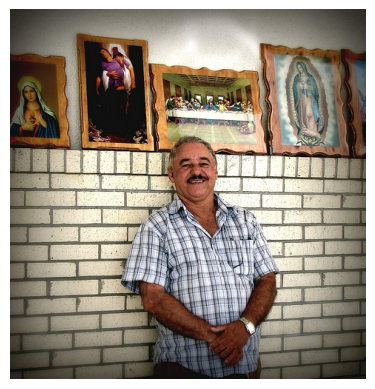

1/1 [==============================] - 0s 19ms/step
man in black shirt and tie is sitting on chair


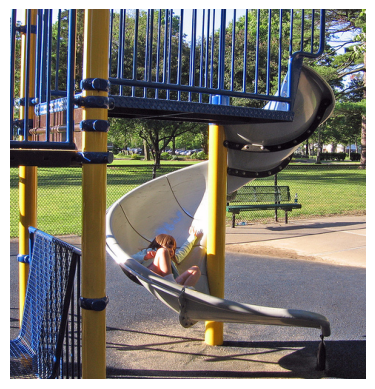

1/1 [==============================] - 0s 29ms/step
boy in green shirt is jumping on merry go round


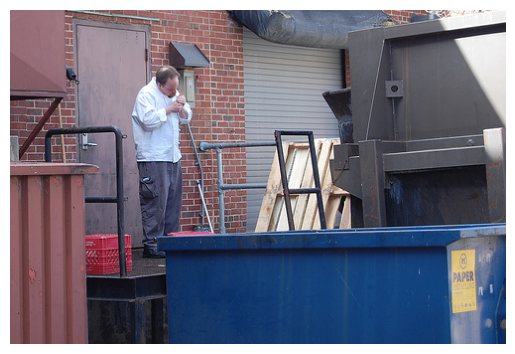

1/1 [==============================] - 0s 37ms/step
man in green shirt and jeans is playing on the stairs


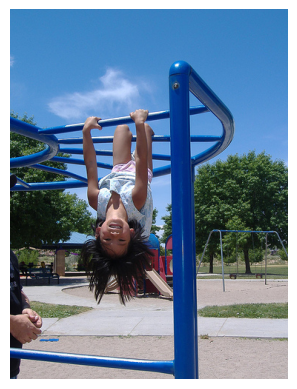

1/1 [==============================] - 0s 27ms/step
girl in pink bathing suit is jumping into pool of water


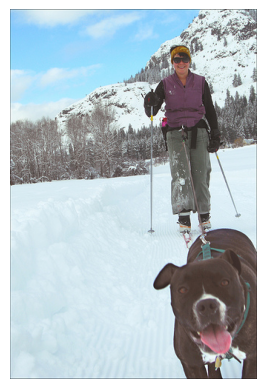

1/1 [==============================] - 0s 23ms/step
two children are playing hockey in snow


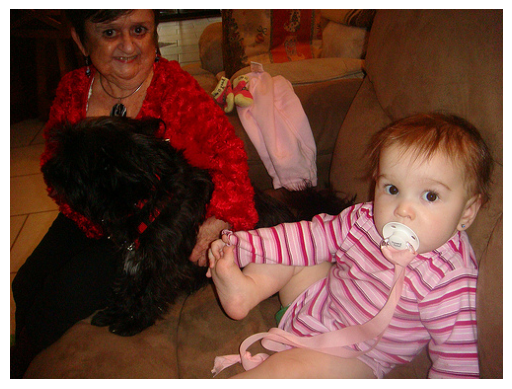

1/1 [==============================] - 0s 28ms/step
two girls are playing tug war war


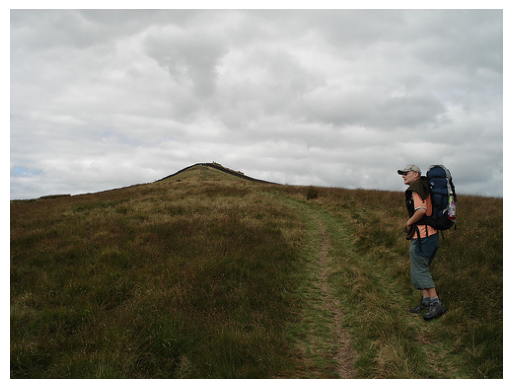

1/1 [==============================] - 0s 31ms/step
man in green shirt and sunglasses is standing on rock overlooking valley


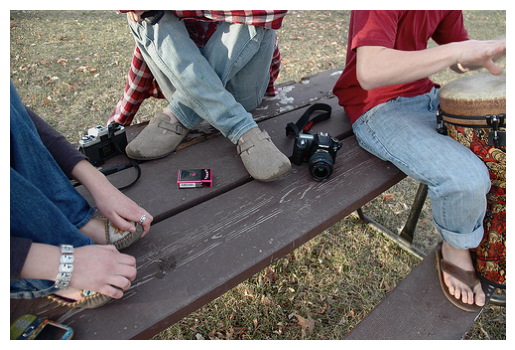

1/1 [==============================] - 0s 29ms/step
man in black shirt and black leather is holding his hand on his shoulder


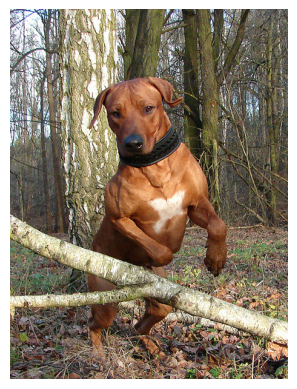

1/1 [==============================] - 0s 26ms/step
brown dog is running on the grass


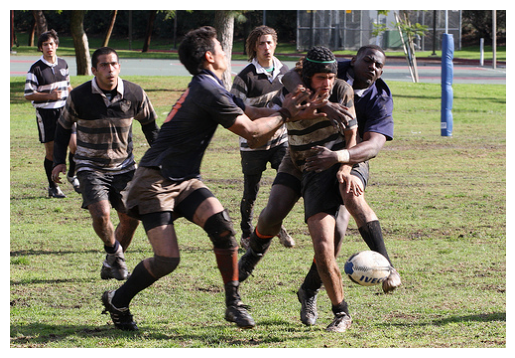

1/1 [==============================] - 0s 29ms/step
group of men in field playing rugby


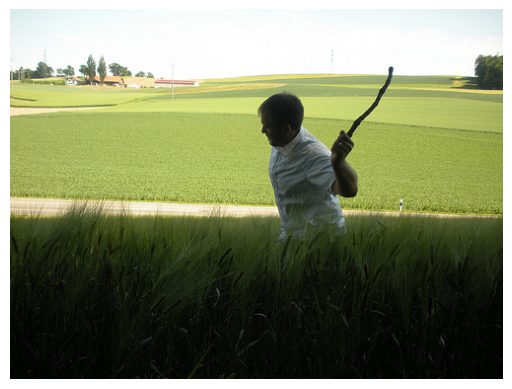

1/1 [==============================] - 0s 28ms/step
boy in blue shirt is jumping off swing


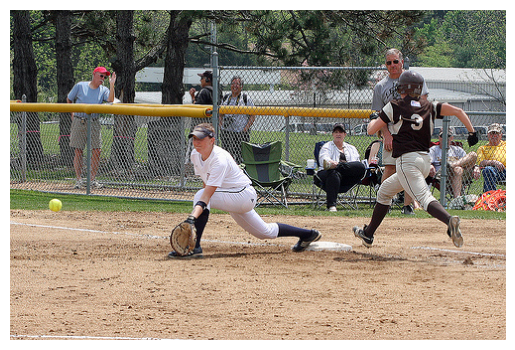

1/1 [==============================] - 0s 26ms/step
soccer player just getting ready to hit the ball


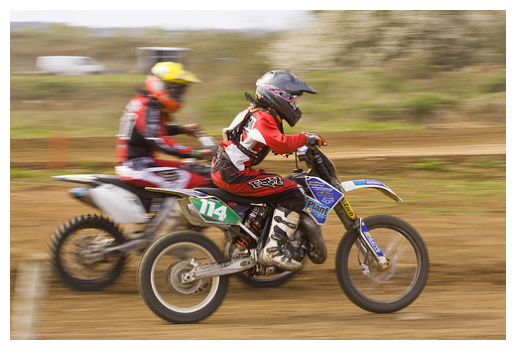

1/1 [==============================] - 0s 26ms/step
man in red helmet riding bicycle on dirt path


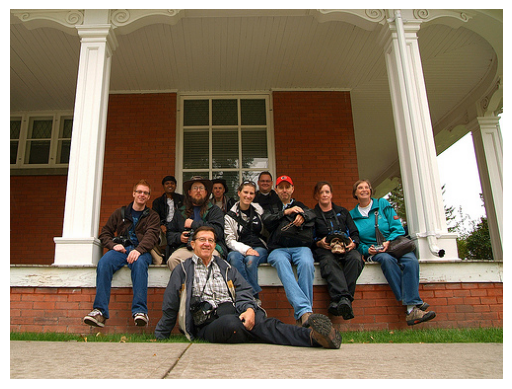

1/1 [==============================] - 0s 27ms/step
group of people are walking down the street


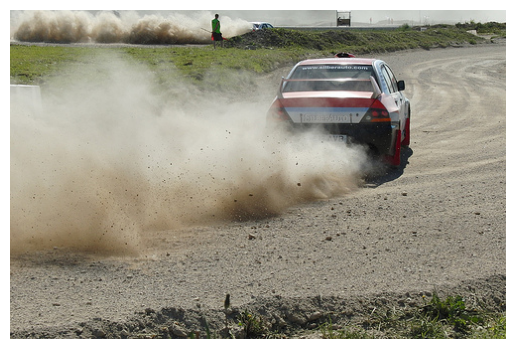

1/1 [==============================] - 0s 45ms/step
the yellow car is on the dirt


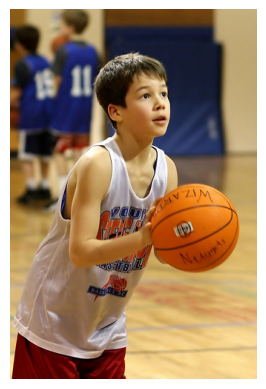

1/1 [==============================] - 0s 59ms/step
the basketball player in the orange the number the ball


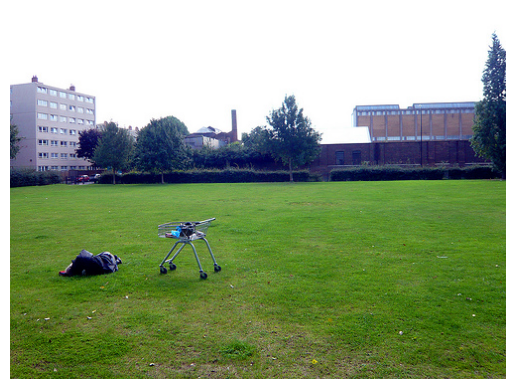

1/1 [==============================] - 0s 27ms/step
boy in red shirt and jeans is jumping on swing


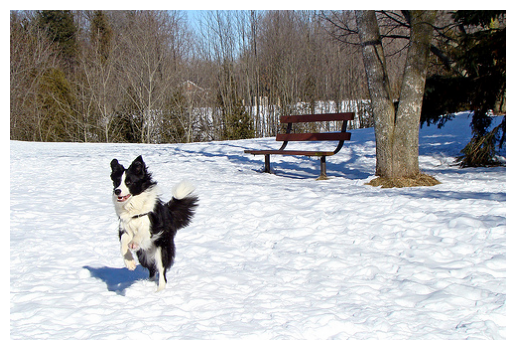

1/1 [==============================] - 0s 29ms/step
two children are playing in the snow


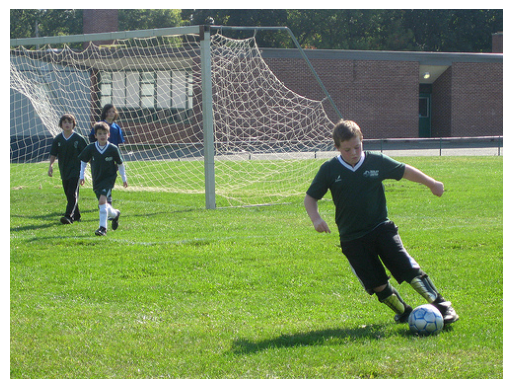

1/1 [==============================] - 0s 27ms/step
soccer player in blue and white uniform is running in field


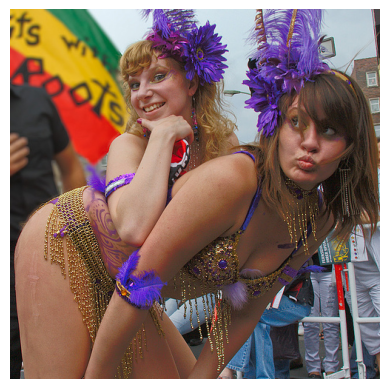

1/1 [==============================] - 0s 27ms/step
two girls in skirts outfits are standing in front of pool


In [ ]:
for i in range(20):
  rn = np.random.randint(0,1000)
  img_name=list(encoding_test.keys())[rn]
  photo = encoding_test[img_name].reshape((1,2048))

  i=plt.imread(images+img_name)
  plt.imshow(i)
  plt.axis("off")
  plt.show()

  caption=predict_caption(photo)
  print(caption)